# Setup 

In [33]:
using CSV, DataFrames, Tables, XLSX
using Gadfly, Plots
using Compose
using Flux #ML #Flux v0.14.15
using Zygote #gradient #Zygote v0.6.70
using Statistics
using Colors 
using Cairo 
using CategoricalArrays 
using Distributions
using Distances
using DifferentialEquations, DiffEqParamEstim #DiffEqFlux, #DifferentialEquations v7.11.0; DiffEqParamEstim v2.2.0
# using SciMLSensitivity

using Random
Random.seed!(1234)

TaskLocalRNG()

# Functions

In [34]:
##train critic
function train_critic!(critic, real_patients, latent_dim)
    
    noise = randn(latent_dim, batch_size) 
    
    ps = Flux.params(critic)
    
    # Create Fake patients
    fake_patients = generator(noise)
    
    ## Calculate gradient penatly
    gp = gradient_penalty(batch_size, real_patients, fake_patients)
    
    # Calculate gradient from loss
    loss, back = Zygote.pullback(ps) do
  
        ## Get prediction for real and fake patients
        real_logit = critic(real_patients)
        fake_logit = critic(fake_patients)
        
        ## Calculate critic loss
        c_cost = critic_loss(real_logit, fake_logit)
        
        ## Add the gradient penalty to the original critic loss
        loss = c_cost + (gp .* gp_weight) 
    end
    
    # To get the gradients we evaluate the pullback with 1.0 as a seed gradient.
    grads = back(1.f0)

    # Update the parameters of the discriminator with the gradients we calculated above
    Flux.update!(opt_critic, ps, grads)
    
    return loss 
end

############################

##train generator
function train_gen!(critic, generator)
    # Sample noise
    noise = randn(latent_dim, batch_size);

    # Define parameters and get the pullback
    ps = Flux.params(generator)
    
    # Evaluate the loss function while calculating the pullback. We get the loss for free
    loss, back = Zygote.pullback(ps) do
        fake_patients = generator(noise)
        fake_logit = critic(fake_patients);
        loss = generator_loss(fake_logit) 
    end
    
    # Evaluate the pullback with a seed-gradient of 1.0 to get the gradients for
    # the parameters of the generator
    grads = back(1.0f0)# (one())#
    
    Flux.update!(opt_gen, ps, grads)
    return loss
end

############################

##gradient penalty
""" Calculates the gradient penalty.

https://papers.nips.cc/paper/2017/file/892c3b1c6dccd52936e27cbd0ff683d6-Paper.pdf

This loss is calculated on an interpolated image
and added to the discriminator loss.
"""
function gradient_penalty(batch_size, real_patients, fake_patients)
    ps = Flux.params(critic)

    # Get the interpolated image and get prediction
    Alpha = rand(Float64, (batch_size)) 
    global interpolated = Alpha' .* real_patients + (1 .-Alpha') .* fake_patients
    
    # Get loss and gradient of interpolated patients
    g = gradient(Flux.params(critic)) do
         sum(critic(interpolated))
       end

    # Calculate the gradients w.r.t to this interpolated image.
    grads = g[GlobalRef(Main,:interpolated)]

    # Calculate the norm of the gradients.
    norm = sqrt.(sum(grads.^2))
    gp = Flux.mean((norm -1.0)^2)
    return gp
end

############################

##critic loss
function critic_loss(real_logit, fake_logit) #real_logit: critic prediction on real patients, fake_logit: critic prediction on fake patients
    return mean(fake_logit) - mean(real_logit) #real_loss - fake_loss
end

############################

##generator loss
function generator_loss(fake_logit)
    return -mean(fake_logit) #fake_logit: critic prediction on fake patients
end;

############################

function plotting(X_train, latent_dim)
    noise = randn(latent_dim, size(X_train)[end])
    fake_patients = generator(noise);
    #make empty plot with only axis lables
    p = Gadfly.plot(Coord.cartesian(xmin=0, xmax=time_max, ymin=-1.25, ymax=1.25), 
    Guide.xlabel("""Time [h]"""), Guide.ylabel("""Relative concentration"""))

    #add layers with plots
    append!(p.layers, layer(x=time_pt[1], y=median(fake_patients, dims=2)'[1:time_n], Geom.line, 
            color = [RGB(205/255, 38/255, 38/255)], style(line_width=0.5mm)))

    for i in 1: size(X_train)[2]
        append!(p.layers, layer(x=time_pt[1], y=X_train[1:time_n,i], Geom.line, 
                color = [RGB(107/255, 107/255, 107/255)], style(line_width=0.5mm)))
    end
    display(p)
end;


# Model

## Data loading

In [35]:
df_orig_demo = CSV.read("2025-07_orig_pat_to_wgan.csv", DataFrame; missingstring="NA")

df_orig_demo

Row,Column1,id,0.5,1,1.5,2,4,6,8,12,sex,WT,HT,AGE
,Int64,Int64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,String1,Float64,Float64,Float64
1,1,1,-0.0886751,0.447968,0.207406,0.43843,-0.0434188,-0.4749,-0.701514,-0.979689,m,0.294118,0.611111,0.722222
2,2,2,-0.770314,-0.522274,-0.362883,-0.439958,-0.41897,-0.379641,-0.642185,-0.767857,m,1.0,0.333333,-0.333333
3,3,3,-0.561954,-0.252651,-0.41646,-0.241204,-0.318253,-0.330497,-0.663827,-0.896264,f,-1.0,-1.0,0.5
4,4,4,-0.595755,-0.185008,-0.0168407,0.0215823,-0.0123515,-0.244715,-0.430028,-0.78934,f,0.0980392,-0.555556,-0.777778
5,5,5,-0.432998,-0.103614,-0.0598027,-0.28212,0.0584297,-0.280453,-0.550633,-0.760279,m,0.803922,0.166667,0.666667
6,6,6,-0.27976,0.111673,0.254619,0.515655,-0.0836956,-0.318105,-0.690679,-0.911352,m,-0.568627,-0.611111,-0.388889
7,7,7,-0.511728,-0.139173,0.0705514,0.126442,-0.185493,-0.179346,-0.724803,-0.79527,m,0.45098,0.444444,1.0
8,8,8,-0.668618,-0.479407,-0.348893,-0.355608,-0.289094,-0.500898,-0.62409,-0.811819,m,0.647059,1.0,0.388889
9,9,9,-0.514394,-0.273987,-0.128468,-0.0858166,-0.119122,-0.421359,-0.637617,-0.869516,f,-0.686275,-0.888889,-0.944444


In [36]:
df_demo = select(df_orig_demo, Not(:1, :2)) 

#One hot encoding
df_demo_hot = Flux.onehotbatch( df_demo[!,:sex],[:"m", :"f" ])'; 

DataFrames.insertcols!(df_demo, :Male => df_demo_hot[:,1], :Female => df_demo_hot[:,2],)
select!(df_demo, Not(:sex));

size(df_demo)[2]

names(df_demo)

13-element Vector{String}:
 "0.5"
 "1"
 "1.5"
 "2"
 "4"
 "6"
 "8"
 "12"
 "WT"
 "HT"
 "AGE"
 "Male"
 "Female"

## Parameters


In [37]:
batch_size = size(df_demo)[1]
n_features = size(df_demo)[2] 
gp_weight = 10.0 #fixed number for gradient penatly
latent_dim = n_features*5 #latent dimensions for fake data
output_period = 20000 #how often to plot during training
num_epochs = 150000
lr_c = 1e-4 
lr_g = 1e-4
c_steps = 5 #additional training steps for critic

time_pt = [[0.5 1 1.5 2 4 6 8 12] for _ in 1:20]; 
time_n = size(time_pt[1])[2]
time_max=maximum(time_pt[1])

#Optimzer
##critic
opt_critic = OADAM(lr_c, (0, 0.9))

#generator
opt_gen = OADAM(lr_g, (0, 0.9))

# Batch separation
X_train = copy(Matrix(df_demo)') # convert to transpose matrix

X_train=Float32.(X_train)

# #create batches
train_loader = Flux.Data.DataLoader(X_train, batchsize=batch_size, shuffle=true)


1-element DataLoader(::Matrix{Float32}, shuffle=true, batchsize=20)
  with first element:
  13×20 Matrix{Float32}

## Network

In [38]:

## critic
critic = Chain(
    Dense(n_features, n_features*9, leakyrelu),
    Dropout(0.2),
    Dense(n_features*9, n_features*4, leakyrelu),
    Dropout(0.1),
    Dense(n_features*4, n_features*9, leakyrelu),
    Dense(n_features*9, 1))

## generator
generator = Chain(
    Dense(latent_dim, n_features*9, leakyrelu),
    Dense(n_features*9, n_features*4, leakyrelu),
    Dense(n_features*4, n_features*9, leakyrelu),  
    Dense(n_features*9, n_features));

## Training

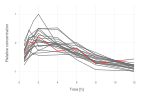

interation 20000:
interation 40000:
interation 60000:
interation 80000:
interation 100000:
interation 120000:
interation 140000:


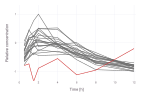

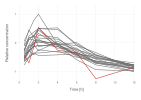

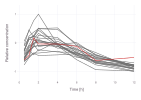

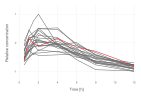

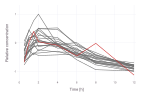

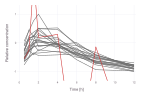

In [39]:
lossvec_gen = zeros(num_epochs)
lossvec_critic = zeros(num_epochs)
distvec = zeros(num_epochs)

## with Batches
for n in 1: num_epochs
    loss_sum_gen = 0.0f0
    loss_sum_critic = 0.0f0
    dist = 0.0f0

    
    for x in train_loader
        real_patients = x

        ## Train the critic, more often than the generator
        for step in 1:c_steps
            global loss_critic = train_critic!(critic, real_patients, latent_dim)
        end

        loss_sum_critic += loss_critic

        ## Train the generator, once
        loss_gen = train_gen!(critic, generator)
        loss_sum_gen += loss_gen
    end
    ## Add the per-sample loss of the generator and discriminator
    lossvec_gen[n] = loss_sum_gen / size(X_train)[end]
    lossvec_critic[n] = loss_sum_critic / size(X_train)[end]

    ## Add the per-sample loss of the generator and discriminator    
    noise = randn(latent_dim, size(X_train)[end])

    fake_patients = generator(noise)
    
    for n in 1:size(X_train)[2]
        dist += abs(sqrt.(sum(X_train[:,n].^2)) - sqrt.(sum(fake_patients[:,n].^2)))
    end
    
    distvec[n] = dist
    
## Plotting every output_period
    if n % output_period == 0
        println("interation ", n, ":")
        plotting(X_train, latent_dim)
    end
end


## Loss

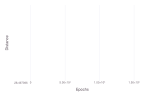

In [40]:
plt = Gadfly.plot(Coord.cartesian(ymax=10),Guide.xlabel("""Epochs"""), Guide.ylabel("""Distance""")) 

append!(plt.layers, layer(x=1:num_epochs, y=distvec,  Geom.smooth(method=:loess,smoothing=0.9)));

display(plt)


## Curves

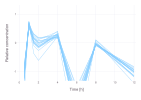

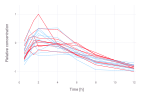

In [41]:
noise = randn(latent_dim, 20) 
fake_data = generator(noise)

###Plotting for fake data
p = Gadfly.plot(Coord.cartesian(xmin=0, xmax=time_max, ymin=-1.25, ymax=1.25), Guide.xlabel("""Time [h]"""), Guide.ylabel("""Relative concentration"""))

n = size(fake_data)[1]

df_cold = Flux.onecold( fake_data[n-1:n,:], [:"m", :"f"]) #one cold encoding of sex
plot_fake = vcat(fake_data[1:n-1, :], permutedims(df_cold)) #remove male/female information and add one cold encoded sex (as transpose)

males_fake = plot_fake[:, plot_fake[n,:] .== "m"]
females_fake= plot_fake[:, plot_fake[n,:] .== "f"]


for i in 1: size(males_fake)[2]
    append!(p.layers, layer(x=time_pt[1], y=males_fake[1:time_n,i], Geom.line, 
             style(line_width=0.3mm), color = [RGB(135/255, 205/255, 255/255)]))#, colour=categorical(X_train[30,:]))) #color = [RGB(107/255, 107/255, 107/255)],
end

for i in 1: size(females_fake)[2]
    append!(p.layers, layer(x=time_pt[1], y=females_fake[1:time_n,i], Geom.line, 
             style(line_width=0.3mm), color = [RGB(255/255, 20/255, 47/255)]))#, colour=categorical(X_train[30,:]))) #color = [RGB(107/255, 107/255, 107/255)],
end

display(p)


##Plotting of real data

plt = Gadfly.plot(Coord.cartesian(xmin=0, xmax=time_max, ymin=-1.25, ymax=1.25), Guide.xlabel("""Time [h]"""), Guide.ylabel("""Relative concentration"""))

males = X_train[:, X_train[n-1,:] .== 1]
females= X_train[:, X_train[n,:] .== 1]

for i in 1: size(males)[2]
    append!(plt.layers, layer(x=time_pt[1], y=males[1:time_n,i], Geom.line, 
             style(line_width=0.3mm), color = [RGB(135/255, 205/255, 255/255)]))#, colour=categorical(X_train[30,:]))) #color = [RGB(107/255, 107/255, 107/255)],
end

for i in 1: size(females)[2]
    append!(plt.layers, layer(x=time_pt[1], y=females[1:time_n,i], Geom.line, 
             style(line_width=0.3mm), color = [RGB(255/255, 20/255, 47/255)]))#, colour=categorical(X_train[30,:]))) #color = [RGB(107/255, 107/255, 107/255)],
end

display(plt)

# Diverse Sampling

In [42]:

num_select = 40 #change depending on how many patients you want to select
noise = randn(latent_dim, num_select*5)  
fake_data = generator(noise);

In [43]:

function pairwise_distances(samples)
    num_samples = size(samples, 2)
    dist_matrix = zeros(Float64, num_samples, num_samples)
    
    for i in 1:num_samples
        for j in i+1:num_samples
            dist = euclidean(samples[:, i], samples[:, j])
            dist_matrix[i, j] = dist
            dist_matrix[j, i] = dist  # The distance matrix is symmetric
        end
    end
    
    return dist_matrix
end

# Calculate the pairwise distances
dist_matrix = pairwise_distances(fake_data);

In [44]:
function select_most_different_samples(dist_matrix, num_select)
    num_samples = size(dist_matrix, 1)
    selected_indices = [1]  # Start with the first sample (you can start with a random sample as well)
    
    while length(selected_indices) < num_select
        max_min_dist = -Inf
        next_index = 0
        
        for i in 1:num_samples
            if i in selected_indices
                continue
            end
            
            min_dist_to_selected = minimum(dist_matrix[i, selected_indices])
            if min_dist_to_selected > max_min_dist
                max_min_dist = min_dist_to_selected
                next_index = i
            end
        end
        
        push!(selected_indices, next_index)
    end
    
    return selected_indices
end


select_most_different_samples (generic function with 1 method)

In [45]:

# Select the 10 most different samples
selected_indices = select_most_different_samples(dist_matrix, num_select)

# Extract the selected samples
selected_samples = fake_data[:, selected_indices];

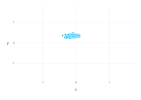

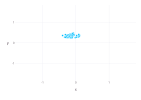

In [46]:
df_fake = DataFrame(fake_data', names(df_demo))

df_fake2 = DataFrame(selected_samples', names(df_demo))

display(Gadfly.plot(x=df_fake.AGE, y=df_fake.WT, Geom.point, 
        Coord.cartesian(xmin=-1.75, xmax=1.75, ymin=-1.75, ymax=1.75)))

display(Gadfly.plot(x=df_fake2.AGE, y=df_fake2.WT, Geom.point, 
        Coord.cartesian(xmin=-1.75, xmax=1.75, ymin=-1.75, ymax=1.75)))

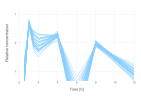

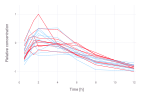

In [47]:
###Plotting for fake data
p = Gadfly.plot(Coord.cartesian(xmin=0, xmax=time_max, ymin=-1.25, ymax=1.25), Guide.xlabel("""Time [h]"""), Guide.ylabel("""Relative concentration"""))

df_cold = Flux.onecold( selected_samples[12:13,:], [:"m", :"f"]) #one cold encoding of sex
plot_fake = vcat(selected_samples[1:11, :], permutedims(df_cold)) #remove male/female information and add one cold encoded sex (as transpose)

males_fake = plot_fake[:, plot_fake[12,:] .== "m"]
females_fake= plot_fake[:, plot_fake[12,:] .== "f"]

for i in 1: size(males_fake)[2]
    append!(p.layers, layer(x=time_pt[1], y=males_fake[1:time_n,i], Geom.line, 
             style(line_width=0.3mm), color = [RGB(135/255, 205/255, 255/255)]))#, colour=categorical(X_train[30,:]))) #color = [RGB(107/255, 107/255, 107/255)],
end

for i in 1: size(females_fake)[2]
    append!(p.layers, layer(x=time_pt[1], y=females_fake[1:time_n,i], Geom.line, 
             style(line_width=0.3mm), color = [RGB(255/255, 20/255, 47/255)]))#, colour=categorical(X_train[30,:]))) #color = [RGB(107/255, 107/255, 107/255)],
end

display(p)


##Plotting of real data

plt = Gadfly.plot(Coord.cartesian(xmin=0, xmax=time_max, ymin=-1.25, ymax=1.25), Guide.xlabel("""Time [h]"""), Guide.ylabel("""Relative concentration"""))

males = X_train[:, X_train[12,:] .== 1]
females= X_train[:, X_train[13,:] .== 1]

for i in 1: size(males)[2]
    append!(plt.layers, layer(x=time_pt[1], y=males[1:time_n,i], Geom.line, 
             style(line_width=0.3mm), color = [RGB(135/255, 205/255, 255/255)]))#, colour=categorical(X_train[30,:]))) #color = [RGB(107/255, 107/255, 107/255)],
end

for i in 1: size(females)[2]
    append!(plt.layers, layer(x=time_pt[1], y=females[1:time_n,i], Geom.line, 
             style(line_width=0.3mm), color = [RGB(255/255, 20/255, 47/255)]))#, colour=categorical(X_train[30,:]))) #color = [RGB(107/255, 107/255, 107/255)],
end

display(plt)

## Saving

In [48]:

df_cold = Flux.onecold(selected_samples[12:13,:], [:"m", :"f"])

df_fake = DataFrame(selected_samples', names(df_demo))

DataFrames.insertcols!(df_fake, :sex => df_cold,)
select!(df_fake, Not(:12, :13)) ;

df_fake

# CSV.write("2025-07_fake_patients_40.csv", df_fake, overwrite=true)

Row,0.5,1,1.5,2,4,6,8,12,WT,HT,AGE,sex
,Float32,Float32,Float32,Float32,Float32,Float32,Float32,Float32,Float32,Float32,Float32,String
1,-1.09034,0.749113,0.18809,0.0472099,0.229066,-2.22542,-0.0474225,-1.02949,0.331829,0.330075,-0.193565,m
2,-1.6381,0.692177,-0.290451,-0.49252,0.296106,-3.22056,-0.0114993,-1.30522,0.398987,0.385257,-0.0792426,m
3,-0.607412,0.561168,0.426436,0.3229,0.22464,-1.19604,-0.127894,-0.737978,0.277988,0.28593,-0.105358,m
4,-1.41886,0.637533,-0.0582843,-0.257588,0.184955,-2.71934,-0.00832759,-1.14435,0.270032,0.231254,-0.30385,m
5,-0.931135,0.640531,0.292788,0.125007,0.243304,-1.65643,-0.0277528,-0.891564,0.346338,0.318736,-0.0925284,m
6,-1.37584,0.83424,-0.00231913,-0.226206,0.413958,-3.04522,0.0759287,-1.13086,0.357406,0.466922,-0.395522,m
7,-1.29114,0.566872,-0.077982,-0.250624,0.22063,-2.48086,-0.0578621,-1.10818,0.409037,0.385825,0.0887034,m
8,-1.58055,0.551871,-0.164358,-0.314243,0.0781659,-2.71734,-0.0870569,-1.24041,0.330479,0.319102,0.107153,m
9,-1.52987,0.628335,-0.104699,-0.32418,0.371129,-2.93716,0.0577862,-1.23368,0.249306,0.33819,-0.111848,m
